In [2]:
from utils import *
from model import *
from diffusion import *
from datamaestro import prepare_dataset

device = torch.device("cuda" if torch.cuda.is_available else "cpu")

2024-01-18 22:15:12.023366: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-18 22:15:13.585364: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-18 22:15:16.768375: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /Infos/lmd/2021/licence/ue/LU3IN029-2021oct/kO6/bin/gcc/lib64::/usr/local/cuda-11.6/lib64:/usr/local/cuda-12.2/lib64:/opt/gurobi801/linux64/lib
2024-01-18 22:15:16.770181: W tensorflow/stream_executor/platform/de

In [3]:
# Main experimental settings
timesteps = 200
epochs = 5

# Loading the dataset
In this notebook, we will look at images from MNIST - but you can redefine this dataset
to learn from other image distributions

In [5]:
ds = prepare_dataset("com.lecun.mnist")
train_data = MnistDataset(ds.train)

torch.Size([28, 28])


/tmp/ipykernel_32196/1091828635.py:6: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  self.images = torch.from_numpy(ds.images.data()).unsqueeze(1) / 255.0


# Displaying images
To visualize the results, we use the `show_image` function that takes
a batch of images (N, 1, H, W) if grayscale or (N, 3, H, W) for RGB

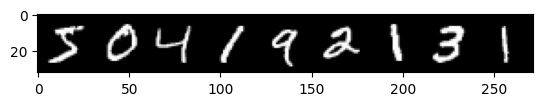

In [7]:
# Now, show some images from the training set
show_images(train_data[0:9][0], nrow = 9)

# Diffusion Process

Let $q(\mathbf{x}_0)$ be the real data distribution, say of "real images". We
can sample from this distribution to get an image, $\mathbf{x}_0 \sim
q(\mathbf{x}_0)$. We define the forward diffusion process $q(\mathbf{x}_t |
\mathbf{x}_{t-1})$ which adds Gaussian noise at each time step $t$, according
to a known variance schedule $0 < \beta_1 < \beta_2 < ... < \beta_T < 1$ as
$$ q(\mathbf{x}_t | \mathbf{x}_{t-1}) = \mathcal{N}(\mathbf{x}_t; \sqrt{1 -
\beta_t} \mathbf{x}_{t-1}, \beta_t \mathbf{I}). $$

Said otherwise, $$ \mathbf{x}_t = \sqrt{1 - \beta_t} \mathbf{x}_{t-1} +
\sqrt{\beta_t} \epsilon $$ with $\epsilon \sim \mathcal N(0, \mathbf{I})$.

# Schedules

There were many propositions to set the $\beta_t$ - whose general name is
*schedule*. Some are defined below:

- `LinearSchedule`
- `QuadraticSchedule`
- `SigmoidSchedule`


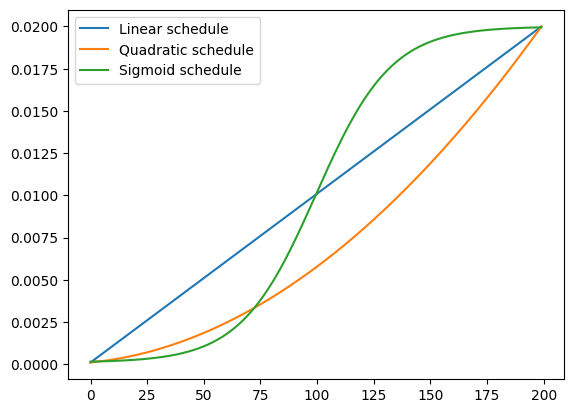

In [9]:
# Display the schedules
plt.plot(LinearSchedule(timesteps).betas, label="Linear schedule")
plt.plot(QuadraticSchedule(timesteps).betas, label="Quadratic schedule")
plt.plot(SigmoidSchedule(timesteps).betas, label="Sigmoid schedule")
plt.legend()
plt.show()

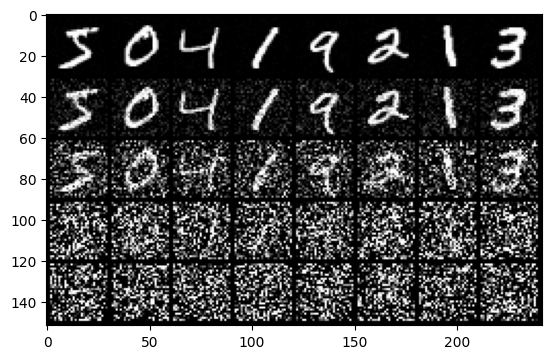

In [13]:
schedule = SigmoidSchedule(timesteps)
sample = torch.Tensor(train_data[0:8][0])

images = []
for t in [0, timesteps // 4, 2 * (timesteps // 4), 3 * (timesteps // 4), timesteps-1]:
    x_t = q_sample(schedule, sample, torch.LongTensor([t]))
    images.append(x_t)

show_images(torch.cat(images))

# Training 

Now that we can generate samples at various time steps, we now turn to
training diffusion models, that is, we want to learn the parametric
distributions $$p_\theta(\mathbf{x}_{t-1} \vert \mathbf{x}_t) =
\mathcal{N}(\mathbf{x}_{t-1}; \boldsymbol{\mu}_\theta(\mathbf{x}_t, t),
\boldsymbol{\Sigma}_\theta(\mathbf{x}_t, t))$$

$$\begin{aligned}
NLL = - \log p_\theta(\mathbf{x}_0) 
&\leq - \log p_\theta(\mathbf{x}_0) + D_\text{KL}(q(\mathbf{x}_{1:T}\vert\mathbf{x}_0) \| p_\theta(\mathbf{x}_{1:T}\vert\mathbf{x}_0) ) \\
&= \mathbb{E}_q \Big[ \log \frac{q(\mathbf{x}_{1:T}\vert\mathbf{x}_0)}{p_\theta(\mathbf{x}_{0:T})} \Big] =  L_{\mathrm{VLB}} \\
\end{aligned}$$
It can be shown that
$$
L_{\mathrm{VLB}} = \mathbb{E}_q [\underbrace{D_\text{KL}(q(\mathbf{x}_T \vert \mathbf{x}_0) \parallel p_\theta(\mathbf{x}_T))}_{L_T} + \sum_{t=2}^T \underbrace{D_\text{KL}(q(\mathbf{x}_{t-1} \vert \mathbf{x}_t, \mathbf{x}_0) \parallel p_\theta(\mathbf{x}_{t-1} \vert\mathbf{x}_t))}_{L_{t-1}} \underbrace{- \log p_\theta(\mathbf{x}_0 \vert \mathbf{x}_1)}_{L_0} ]
$$
where $L$ is constant (since $x_T$ is by hypothesis Gaussian noise) wrt parameters ($q$ has no parameters). The term $L_{t-1}$ is a KL divergence between two Gaussians and can be computed in *closed form*.


## Reparametrization trick


As shown in [(Ho et al., 2021)](https://arxiv.org/abs/2106.15282) is that one
can instead reparametrize the mean to make the neural network learn (predict)
the added noise via a network $\mathbf{\epsilon}_\theta(\mathbf{x}_t, t)$ for
noise level $t$.

Said otherwise, 
$$
\mathbf{x}_{t-1} \vert \mathbf{x}_t \sim \mathcal{N}\left( \frac{1}{\sqrt{\alpha_t}} \Big( \mathbf{x}_t - \frac{1 - \alpha_t}{\sqrt{1 - \bar{\alpha}_t}} \boldsymbol{\epsilon}_\theta(\mathbf{x}_t, t) \Big), \boldsymbol{\Sigma}_\theta(\mathbf{x}_t, t)\right)
$$


The final objective function $L$ - with some extra simplifications 
as shown in [(Ho et al., 2021)](https://arxiv.org/abs/2106.15282), 
is simply:
$$ L = \mathbb{E}_{x_0 \sim q, t \sim \mathcal U(\{1,\ldots, T\})} \|
\mathbf{\epsilon} - \mathbf{\epsilon}_\theta( \sqrt{\bar{\alpha}_t}
\mathbf{x}_0 + \sqrt{(1- \bar{\alpha}_t)  } \mathbf{\epsilon}, t) \|^2$$

Classifier free guidance, during sampling, we use
$$
\tilde{\mathbf{\epsilon}}_\theta(\mathbf{x}_t, t, y)
= (1+w) \mathbf{\epsilon}_\theta(\mathbf{x}_t, t, y) - w \mathbf{\epsilon}_\theta(\mathbf{x}_t, t, \emptyset)
$$


# Training loop

We are now ready to code the training loop. Note that 
instead of using a L2 loss, you can use a Smooth L1
one - which is less sensitive to outliers.

We recall that the final objective function $L$ is:
$$ L = \mathbb{E}_{x_0 \sim q, t \sim \mathcal U(\{1,\ldots, T\})} \|
\mathbf{\epsilon} - \mathbf{\epsilon}_\theta( \sqrt{\bar{\alpha}_t}
\mathbf{x}_0 + \sqrt{(1- \bar{\alpha}_t)  } \mathbf{\epsilon}, t) \|^2$$

Loss: 1.264793872833252


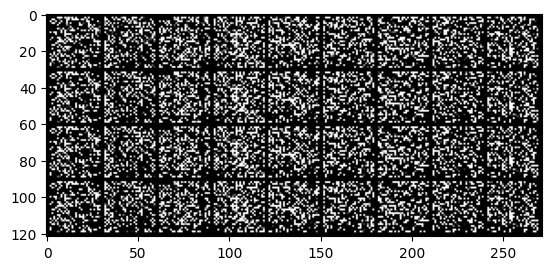

Loss: 0.39229676127433777
Loss: 0.24455973505973816
Loss: 0.16530892252922058
Loss: 0.1303027719259262
Loss: 0.1184859424829483


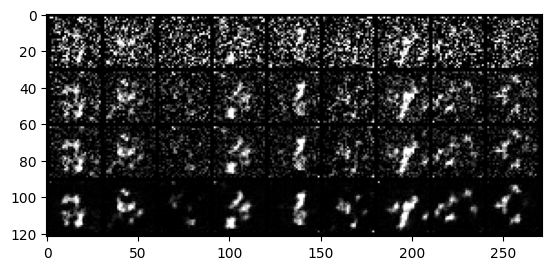

Loss: 0.12366887927055359
Loss: 0.1032465472817421
Loss: 0.10363239794969559
Loss: 0.09436894953250885
Loss: 0.0808539167046547


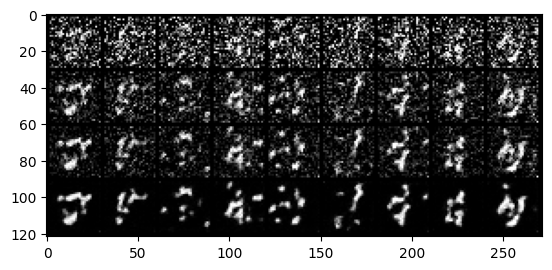

Loss: 0.0899691954255104
Loss: 0.07206422835588455
Loss: 0.07725917547941208
Loss: 0.07928932458162308
Loss: 0.07947837561368942


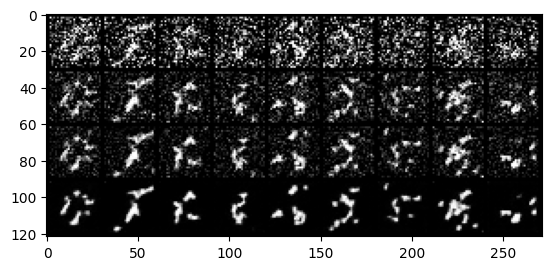

Loss: 0.07071282714605331
Loss: 0.06308773159980774
Loss: 0.07140554487705231
Loss: 0.06975626200437546
Loss: 0.08398938179016113


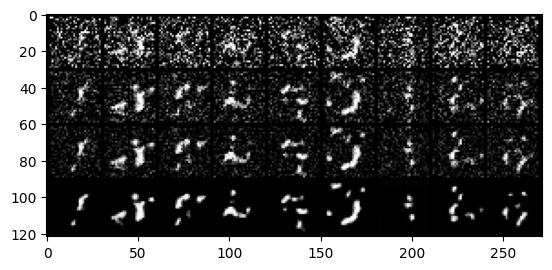

Loss: 0.06880389153957367
Loss: 0.06198268011212349
Loss: 0.07909988611936569
Loss: 0.07093904167413712
Loss: 0.06594228744506836


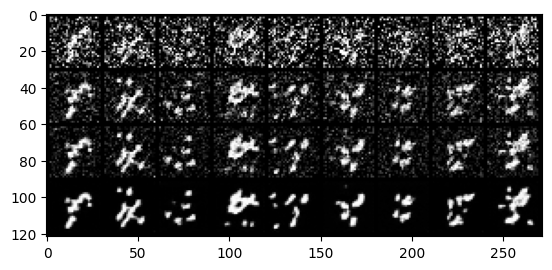

Loss: 0.06062573567032814
Loss: 0.06464322656393051
Loss: 0.058950141072273254
Loss: 0.05932282283902168
Loss: 0.06483650207519531


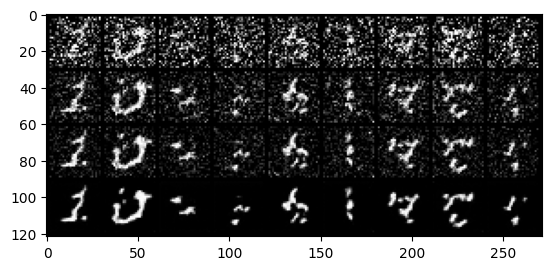

Loss: 0.06296002119779587
Loss: 0.06406831741333008
Loss: 0.06753457337617874
Loss: 0.05868501961231232
Loss: 0.0616876445710659


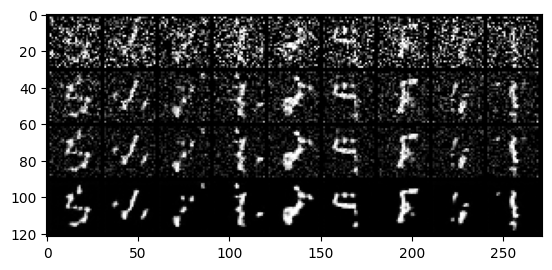

Loss: 0.05841085687279701
Loss: 0.05626827850937843
Loss: 0.05726224556565285
Loss: 0.05601462349295616
Loss: 0.057744503021240234


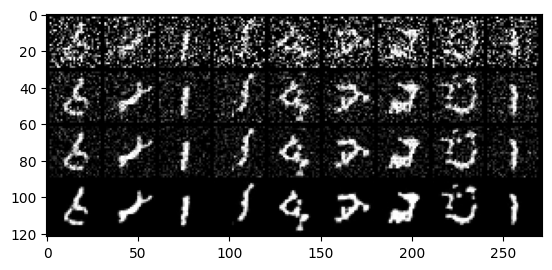

Loss: 0.05938098579645157
Loss: 0.06066074222326279
Loss: 0.05610337480902672
Loss: 0.06441710889339447
Loss: 0.05619320645928383


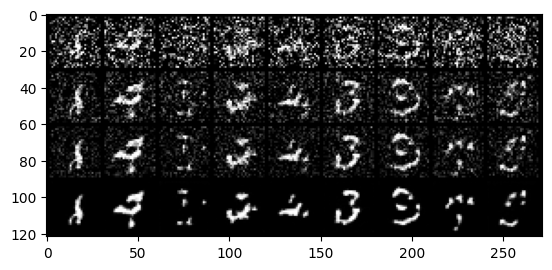

Loss: 0.05805063620209694
Loss: 0.06061353534460068
Loss: 0.0648433119058609
Loss: 0.05500109866261482
Loss: 0.05328559875488281


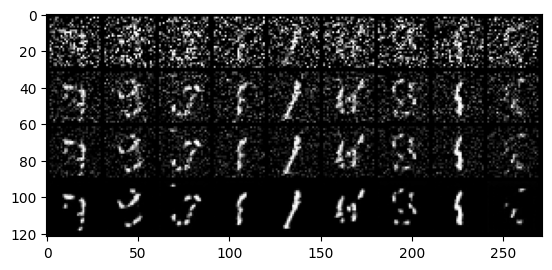

Loss: 0.05114138871431351
Loss: 0.058785341680049896
Loss: 0.05485476553440094
Loss: 0.05838628485798836
Loss: 0.0558026060461998


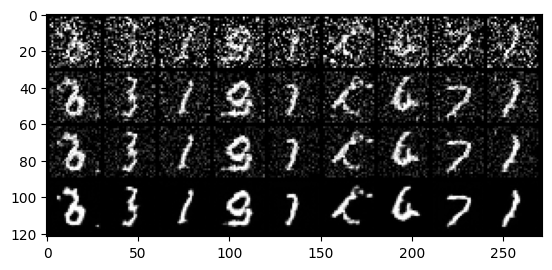

Loss: 0.055024467408657074
Loss: 0.056778497993946075
Loss: 0.05913205444812775
Loss: 0.060970887541770935
Loss: 0.04912625998258591


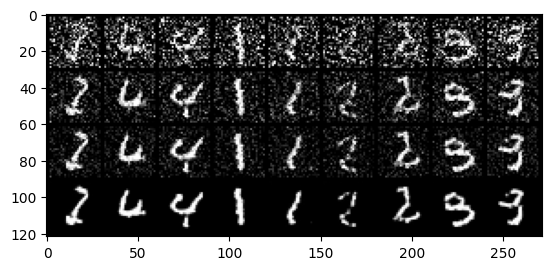

Loss: 0.04778049513697624
Loss: 0.05644990876317024
Loss: 0.05676057189702988
Loss: 0.05284396931529045
Loss: 0.04435209184885025


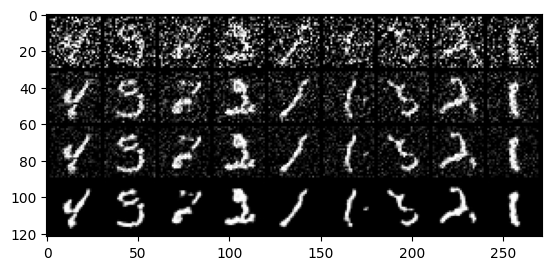

Loss: 0.05007326602935791
Loss: 0.05552785098552704
Loss: 0.05855557695031166
Loss: 0.05106566846370697
Loss: 0.04741211235523224


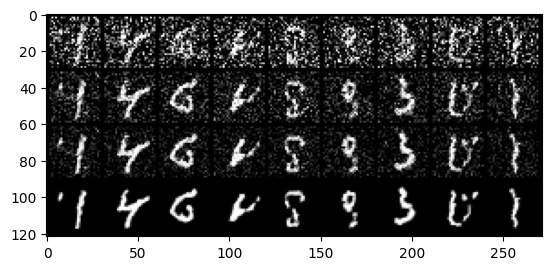

Loss: 0.05886218696832657
Loss: 0.052011147141456604
Loss: 0.05215451866388321
Loss: 0.047295257449150085
Loss: 0.053852811455726624


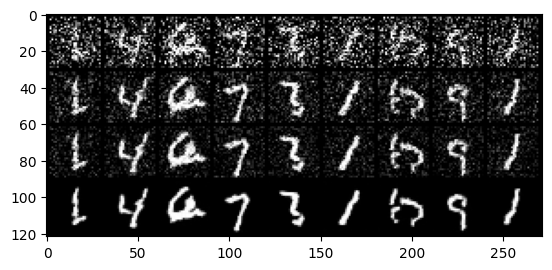

Loss: 0.061299942433834076
Loss: 0.04684418812394142
Loss: 0.05618036910891533
Loss: 0.04383054003119469
Loss: 0.04936647787690163


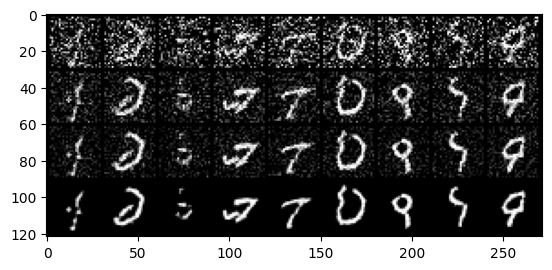

Loss: 0.0444515198469162
Loss: 0.057168979197740555
Loss: 0.04628366231918335
Loss: 0.053621504455804825
Loss: 0.055306628346443176


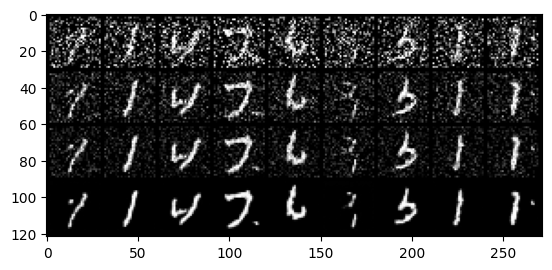

Loss: 0.05137254297733307
Loss: 0.052522238343954086
Loss: 0.049332864582538605
Loss: 0.051148638129234314
Loss: 0.054530058056116104


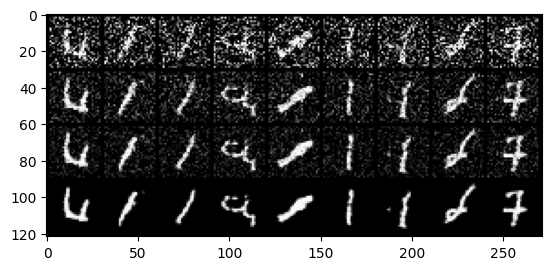

Loss: 0.04712972790002823
Loss: 0.0521647147834301
Loss: 0.0492696650326252
Loss: 0.04731375724077225
Loss: 0.04632669314742088


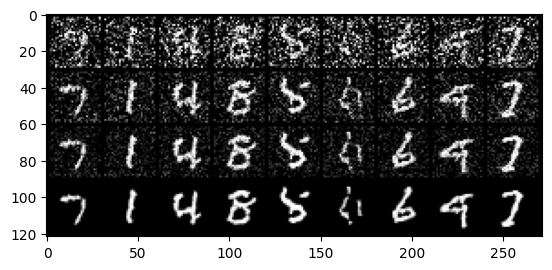

Loss: 0.054381582885980606
Loss: 0.056177567690610886
Loss: 0.04245053604245186
Loss: 0.05338773876428604
Loss: 0.04310687631368637


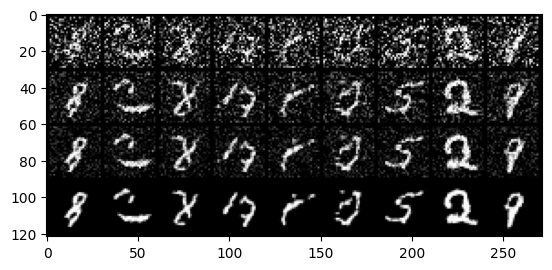

Loss: 0.047722358256578445
Loss: 0.051205165684223175
Loss: 0.052789442241191864
Loss: 0.05063071846961975
Loss: 0.050947751849889755


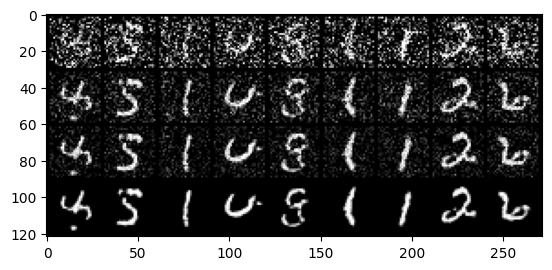

Loss: 0.048472363501787186
Loss: 0.05321888253092766
Loss: 0.0481124222278595
Loss: 0.056784357875585556
Loss: 0.05390056222677231


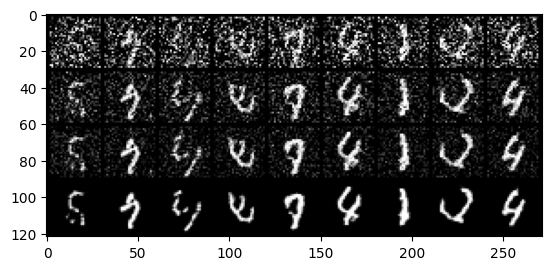

Loss: 0.05068342387676239
Loss: 0.05108644813299179
Loss: 0.04284210503101349
Loss: 0.051802460104227066
Loss: 0.05173144116997719


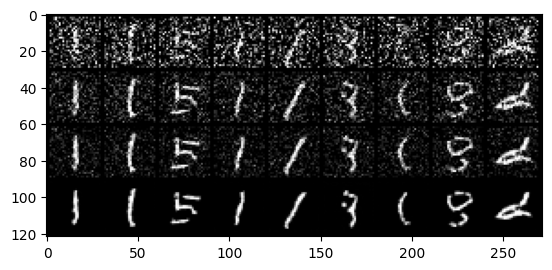

Loss: 0.05214046314358711
Loss: 0.04741675406694412
Loss: 0.05602499842643738
Loss: 0.05449388176202774
Loss: 0.05204230919480324


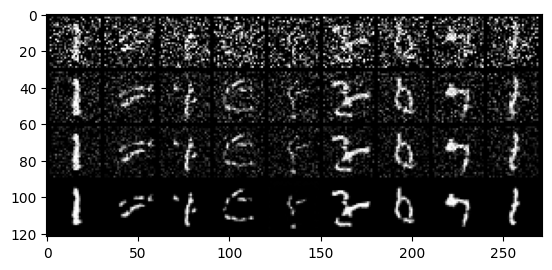

Loss: 0.042767640203237534
Loss: 0.04908956587314606
Loss: 0.047954168170690536
Loss: 0.05163412541151047
Loss: 0.0461127795279026


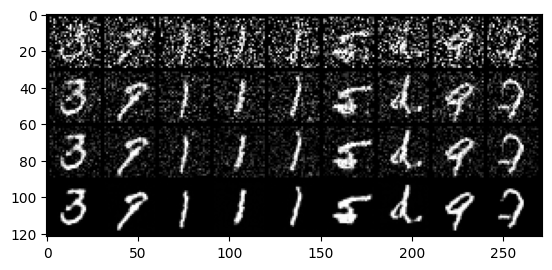

Loss: 0.047475751489400864
Loss: 0.05356715992093086
Loss: 0.05279479920864105
Loss: 0.04087618365883827
Loss: 0.04467560350894928


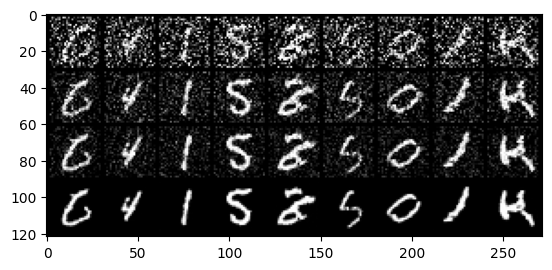

Loss: 0.050417374819517136
Loss: 0.051187627017498016
Loss: 0.04266655072569847
Loss: 0.051877230405807495
Loss: 0.05014991760253906


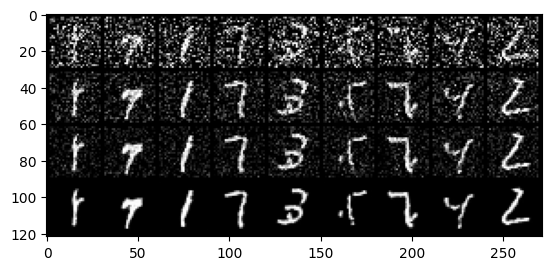

Loss: 0.04800806939601898
Loss: 0.04252123087644577
Loss: 0.048647768795490265
Loss: 0.046587277203798294
Loss: 0.048000190407037735


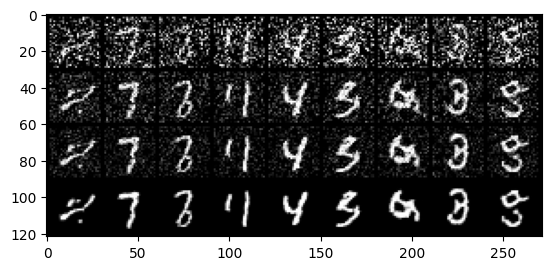

Loss: 0.04618706926703453
Loss: 0.04748840630054474
Loss: 0.04921456798911095
Loss: 0.05059836059808731
Loss: 0.04398428648710251


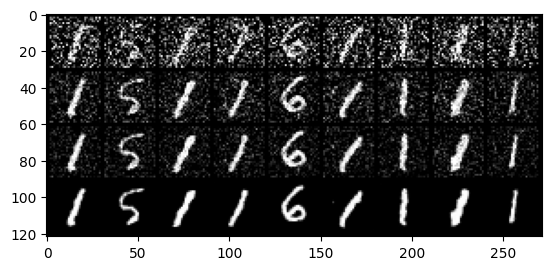

Loss: 0.042646121233701706
Loss: 0.04641984403133392
Loss: 0.047391582280397415
Loss: 0.04044002294540405
Loss: 0.04383119195699692


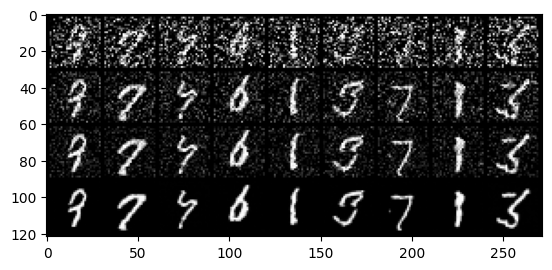

Loss: 0.047507286071777344
Loss: 0.05001899227499962
Loss: 0.053603027015924454
Loss: 0.05259865149855614
Loss: 0.049595821648836136


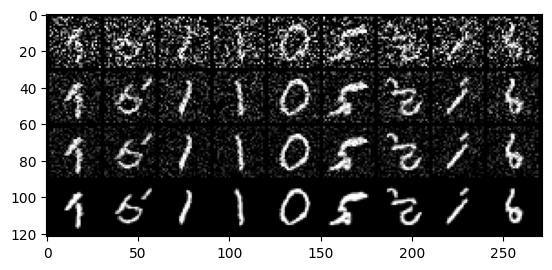

Loss: 0.04640680178999901
Loss: 0.05309717729687691
Loss: 0.04706626757979393
Loss: 0.0458800233900547
Loss: 0.04750806838274002


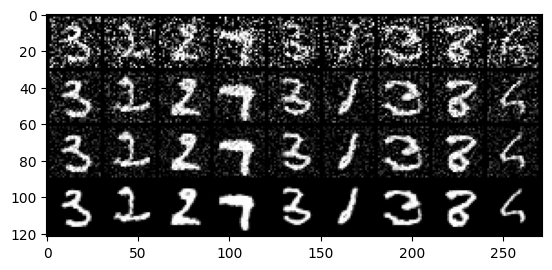

Loss: 0.04257247969508171
Loss: 0.05623292177915573
Loss: 0.04803035035729408
Loss: 0.05115393549203873
Loss: 0.048211097717285156


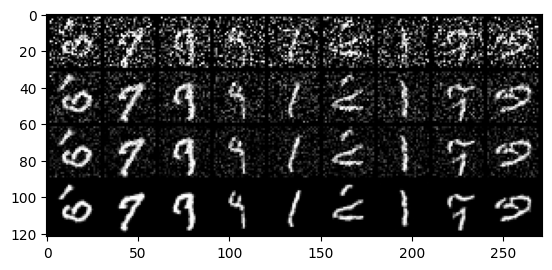

Loss: 0.04839172214269638
Loss: 0.04824937880039215
Loss: 0.049131449311971664
Loss: 0.04732052609324455
Loss: 0.05128086730837822


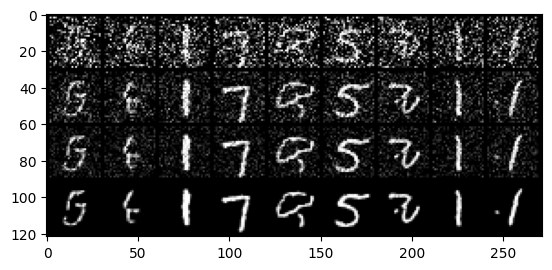

Loss: 0.046305686235427856
Loss: 0.04097678139805794
Loss: 0.051339007914066315
Loss: 0.046550631523132324
Loss: 0.04422369599342346


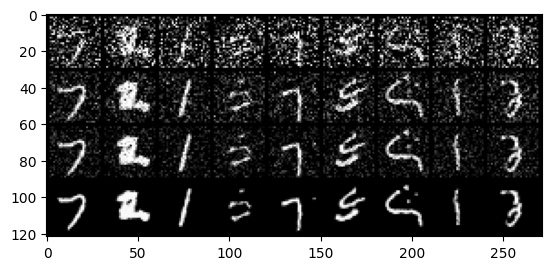

Loss: 0.04936930537223816
Loss: 0.043378595262765884
Loss: 0.04738431051373482
Loss: 0.04448563978075981
Loss: 0.04770708829164505


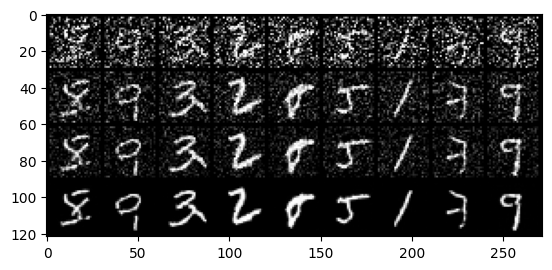

Loss: 0.04305995628237724
Loss: 0.045801836997270584
Loss: 0.04588071256875992
Loss: 0.04796778783202171
Loss: 0.0476846769452095


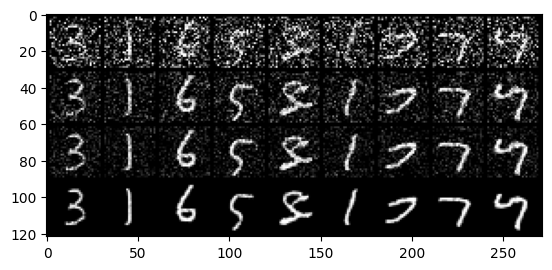

Loss: 0.04886724427342415
Loss: 0.04330120235681534
Loss: 0.05147688463330269
Loss: 0.04161178693175316
Loss: 0.050983596593141556


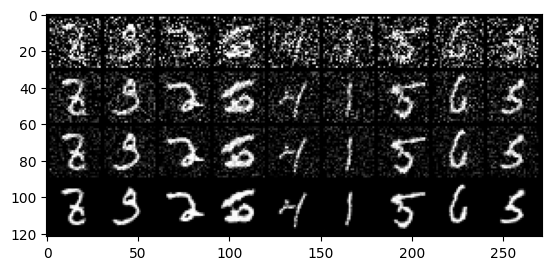

Loss: 0.04885362088680267
Loss: 0.04289853200316429
Loss: 0.05101567879319191
Loss: 0.04890492558479309
Loss: 0.048942819237709045


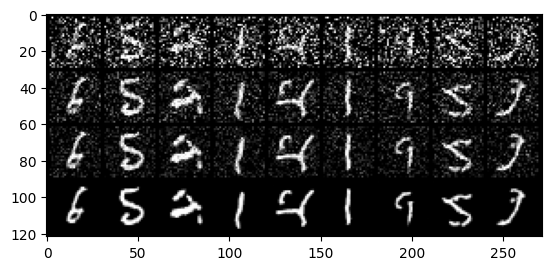

Loss: 0.0455956906080246
Loss: 0.045758772641420364
Loss: 0.04737298563122749
Loss: 0.04123269394040108
Loss: 0.04472724720835686


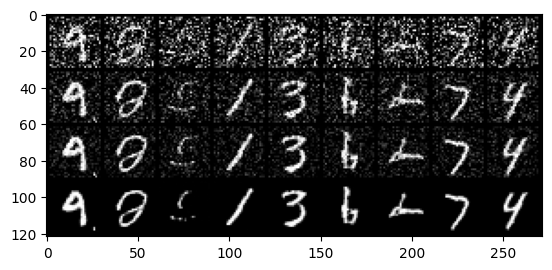

Loss: 0.04293637350201607
Loss: 0.04333367198705673
Loss: 0.04493562504649162
Loss: 0.04372256621718407
Loss: 0.04012032970786095


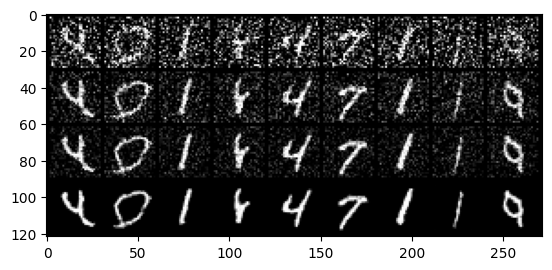

Loss: 0.049076925963163376
Loss: 0.048351261764764786
Loss: 0.04666128009557724
Loss: 0.04602806270122528
Loss: 0.04159597307443619


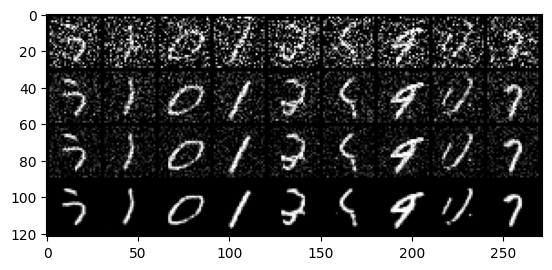

Loss: 0.04919850453734398
Loss: 0.048632051795721054
Loss: 0.046818237751722336
Loss: 0.04492780193686485
Loss: 0.04553554579615593


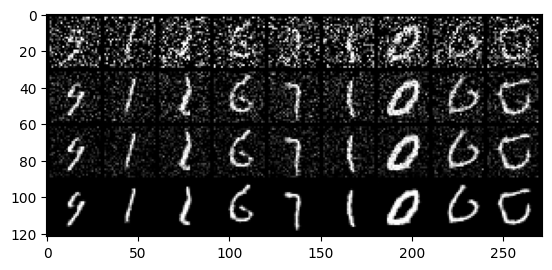

Loss: 0.04178102687001228
Loss: 0.046563420444726944
Loss: 0.04034765809774399
Loss: 0.042361702769994736
Loss: 0.04936688765883446


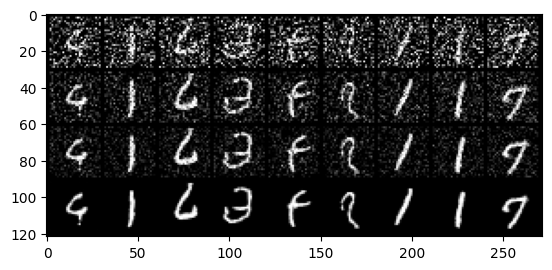

Loss: 0.045800626277923584
Loss: 0.044494692236185074
Loss: 0.0485725961625576
Loss: 0.04861091822385788
Loss: 0.04290151596069336


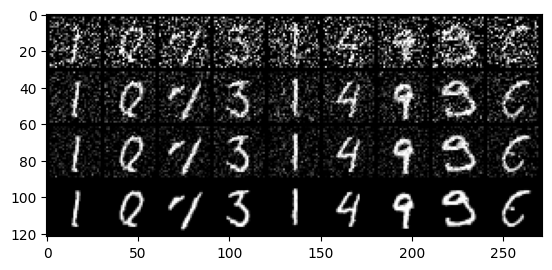

Loss: 0.046578649431467056
Loss: 0.04874183237552643
Loss: 0.04096952825784683
Loss: 0.044248633086681366
Loss: 0.049068838357925415


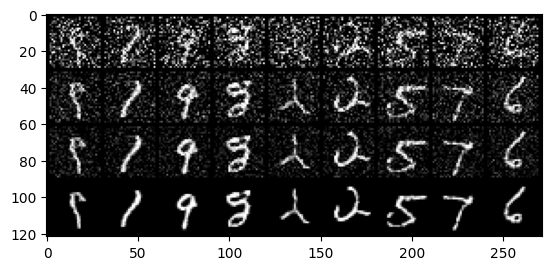

Loss: 0.039840903133153915
Loss: 0.044848859310150146
Loss: 0.047215867787599564
Loss: 0.04813278838992119
Loss: 0.05114361643791199


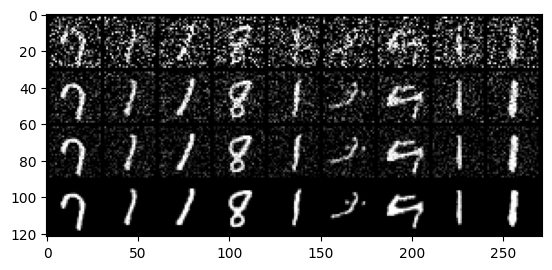

Loss: 0.04388798400759697
Loss: 0.047057364135980606
Loss: 0.04148910939693451
Loss: 0.043115854263305664
Loss: 0.04621122404932976


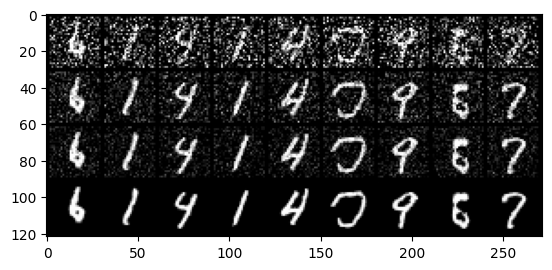

Loss: 0.04141610860824585
Loss: 0.04671178385615349
Loss: 0.050872888416051865
Loss: 0.0480688251554966
Loss: 0.0414901077747345


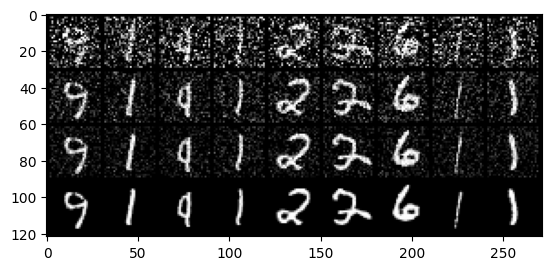

Loss: 0.040913864970207214
Loss: 0.04286639392375946
Loss: 0.04521400108933449
Loss: 0.049339983612298965


In [19]:
class_emb_dim = None
w = 0.5
model = Model(train_data.image_shape[0], train_data.channels, time_emb_dim = 16, cls_emb_dim=class_emb_dim)
model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
dataloader = DataLoader(train_data, batch_size=128, shuffle=True, pin_memory=True)

mse = nn.MSELoss()
mae = nn.L1Loss()
epochs = 50

for epoch in range(epochs):
    for step, (batch, labels) in enumerate(dataloader):
        optimizer.zero_grad()

        batch_size = batch.shape[0]
        batch = batch.to(device)
        noise = torch.normal(mean=0, std=1, size=batch.shape).to(device)
        #noise = torch.randn_like(batch)
        # À compléter...
        if class_emb_dim is None:
            cls = None
        else:
            cls = labels
        t = torch.randint(low=0, high=schedule.timesteps, size=(batch_size,)).to(device)
        sample_imgs = q_sample(schedule, batch, t, noise=noise)
        predicted_noise = model(sample_imgs, t, cls)
        
        loss = mse(predicted_noise, noise)

        if step % 100 == 0:
            print("Loss:", loss.item())

        if step % 1000 == 0:
            if class_emb_dim:
                lab = torch.arange(0, 10).long()
            else:
                lab = None
            image = sample(schedule, model, 9, lab, w)
            show_images(
                torch.cat(
                    [
                        image[-timesteps // 2],
                        image[-timesteps // 3],
                        image[-timesteps // 4],
                        image[-1],
                    ]
                ),
                nrow = 9
            )

        loss.backward()
        optimizer.step()




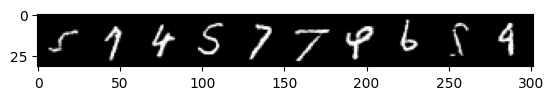

In [39]:

samples = sample(schedule, model, 10)
show_images(samples[-1], nrow = 10)

# Assignment: Conditional Classifier-Free Guidance

You will implement the classifier-free guidance proposed by J. Ho and T.
Salimans [1], with the class labels being 0 to 9 (the digit in MNIST).
You need to change your Noise model to include the class 
label $y$ that you discard with a given probability so that the
model can generate samples without class information, that is 
$$\mathbf{\epsilon}_\theta(\mathbf{x}_t, t, y)$$

During sampling, we use
$$
\tilde{\mathbf{\epsilon}}_\theta(\mathbf{x}_t, t, y)
= (1+w) \mathbf{\epsilon}_\theta(\mathbf{x}_t, t, y) - w \mathbf{\epsilon}_\theta(\mathbf{x}_t, t, \emptyset)
$$


[1] J. Ho and T. Salimans, “Classifier-Free Diffusion Guidance,” presented at
the NeurIPS 2021 Workshop on Deep Generative Models and Downstream
Applications, Nov. 2021. https://openreview.net/forum?id=qw8AKxfYbI

Loss: 1.2831844091415405


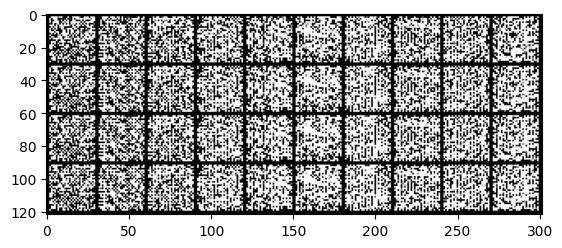

Loss: 0.4643283784389496
Loss: 0.24767310917377472
Loss: 0.18974582850933075
Loss: 0.12494157999753952
Loss: 0.1294991821050644


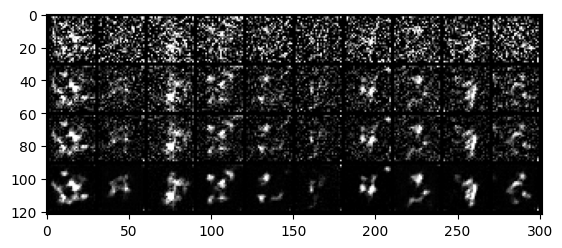

Loss: 0.11672383546829224
Loss: 0.11469859629869461
Loss: 0.10371552407741547
Loss: 0.09354136884212494
Loss: 0.09464634209871292


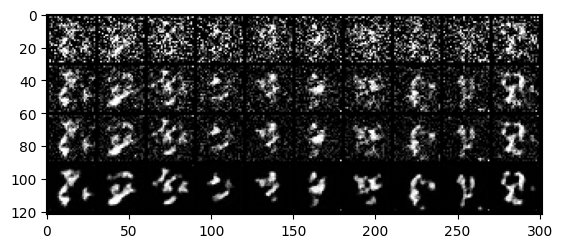

Loss: 0.07631352543830872
Loss: 0.08086294680833817
Loss: 0.08961780369281769
Loss: 0.07722202688455582
Loss: 0.08213475346565247


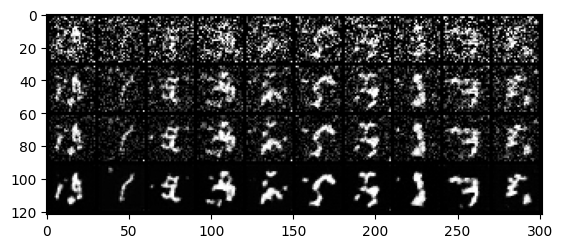

Loss: 0.09274858981370926
Loss: 0.06680846214294434
Loss: 0.06785928457975388
Loss: 0.06790240108966827
Loss: 0.06162522733211517


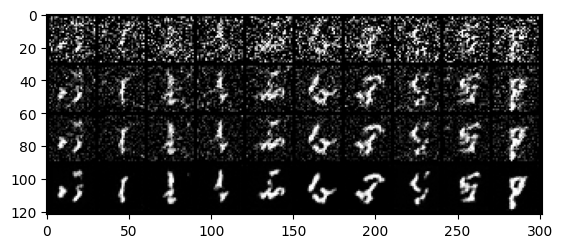

Loss: 0.07175087928771973
Loss: 0.06652914732694626
Loss: 0.0715106949210167
Loss: 0.06628496199846268
Loss: 0.058470871299505234


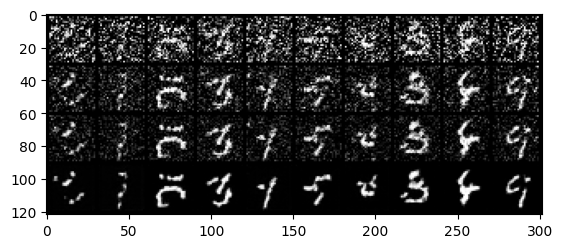

Loss: 0.06715024262666702
Loss: 0.06204626336693764
Loss: 0.0671597272157669
Loss: 0.05829215049743652
Loss: 0.05745081976056099


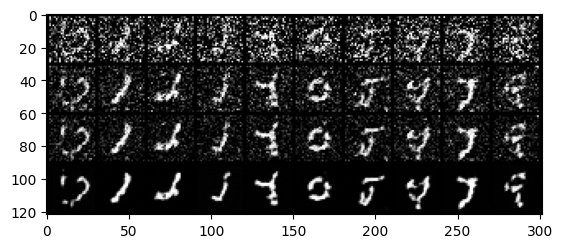

Loss: 0.05828498303890228
Loss: 0.05862613022327423
Loss: 0.06551039963960648
Loss: 0.06289931386709213
Loss: 0.057552386075258255


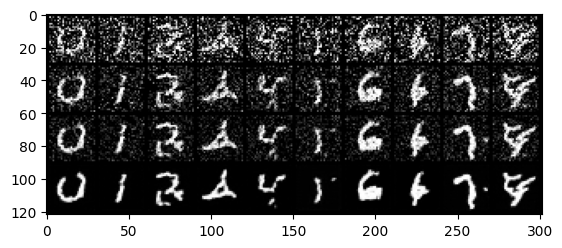

Loss: 0.06300441175699234
Loss: 0.04981505870819092
Loss: 0.05836057662963867
Loss: 0.06412097066640854
Loss: 0.05742853507399559


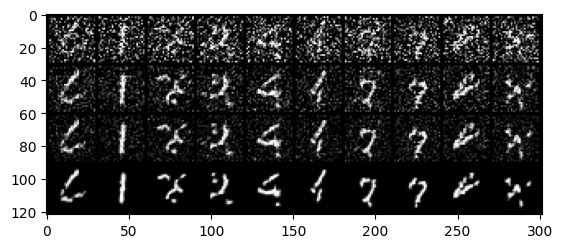

Loss: 0.06145628169178963
Loss: 0.06316254287958145
Loss: 0.057318978011608124
Loss: 0.0532255657017231
Loss: 0.056766577064991


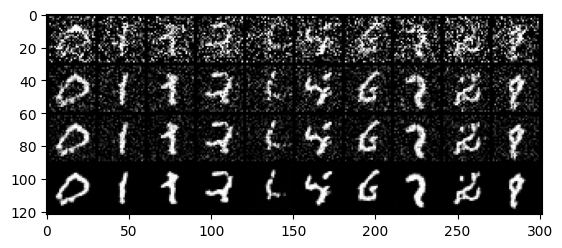

Loss: 0.0655033141374588
Loss: 0.05216130241751671
Loss: 0.05866196006536484
Loss: 0.05497756972908974
Loss: 0.056979499757289886


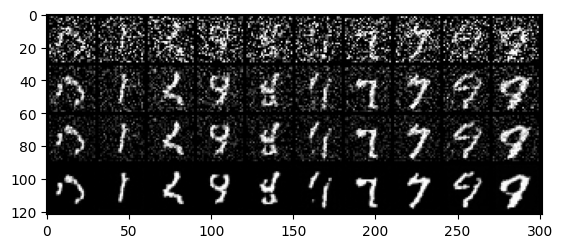

Loss: 0.06356555223464966
Loss: 0.0563143789768219
Loss: 0.057052288204431534
Loss: 0.0536373034119606
Loss: 0.055854473263025284


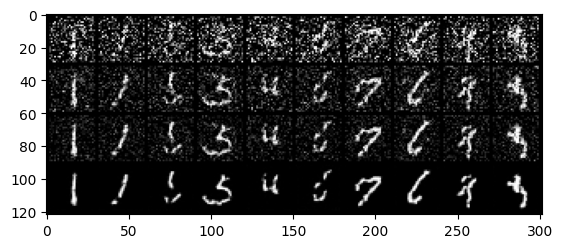

Loss: 0.05227063596248627
Loss: 0.059970922768116
Loss: 0.05109049752354622
Loss: 0.048472996801137924
Loss: 0.04988948628306389


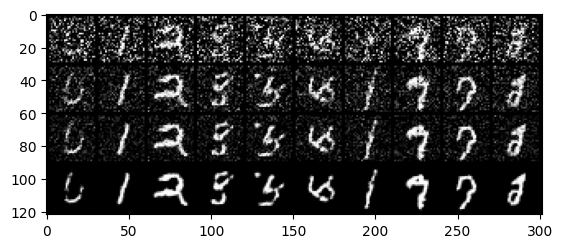

Loss: 0.05160284414887428
Loss: 0.055190540850162506
Loss: 0.057234134525060654
Loss: 0.05800587311387062
Loss: 0.05385679006576538


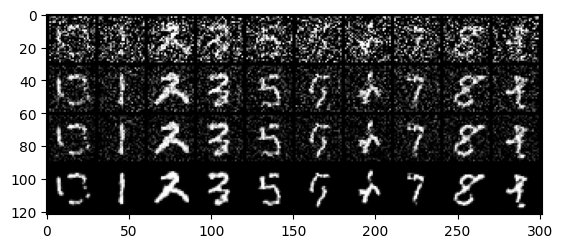

Loss: 0.05258137732744217
Loss: 0.050469547510147095
Loss: 0.043408963829278946
Loss: 0.04784950986504555
Loss: 0.05302329733967781


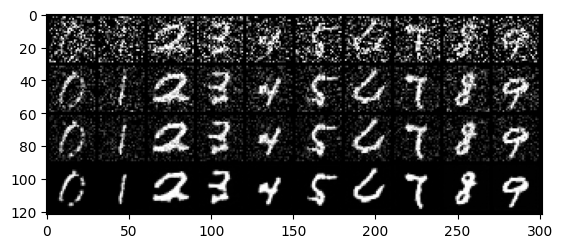

Loss: 0.06149422749876976
Loss: 0.055638909339904785
Loss: 0.05189709737896919
Loss: 0.054244622588157654
Loss: 0.04788500815629959


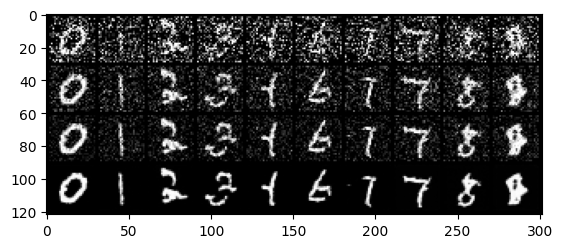

Loss: 0.04920352250337601
Loss: 0.04738570749759674
Loss: 0.05635306239128113
Loss: 0.04813690483570099
Loss: 0.05779462680220604


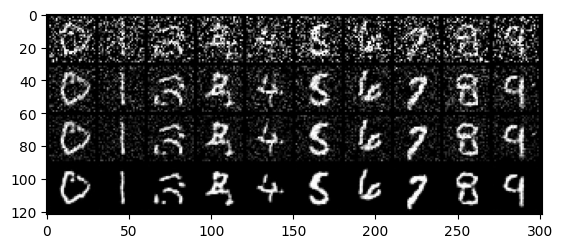

Loss: 0.051161881536245346
Loss: 0.04794256016612053
Loss: 0.05390086770057678
Loss: 0.05110400915145874
Loss: 0.05344919115304947


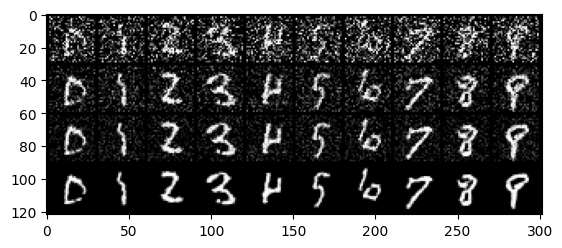

Loss: 0.05282483249902725
Loss: 0.04735826328396797
Loss: 0.05384865775704384
Loss: 0.05195063725113869
Loss: 0.04533662647008896


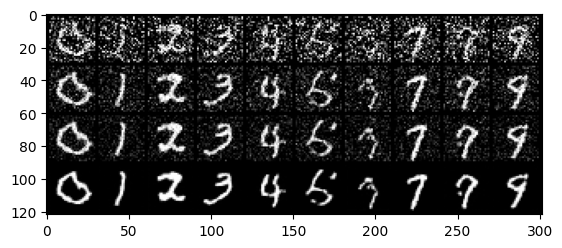

Loss: 0.044852010905742645
Loss: 0.047633592039346695
Loss: 0.04686582088470459
Loss: 0.05235830694437027
Loss: 0.051440734416246414


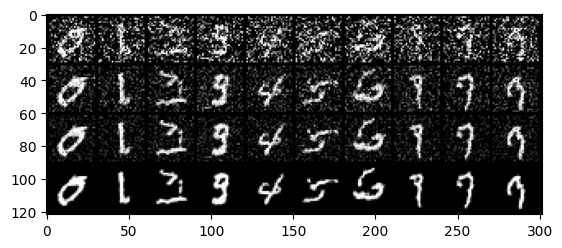

Loss: 0.046218063682317734
Loss: 0.05044064298272133
Loss: 0.049351759254932404
Loss: 0.04166042432188988
Loss: 0.043258730322122574


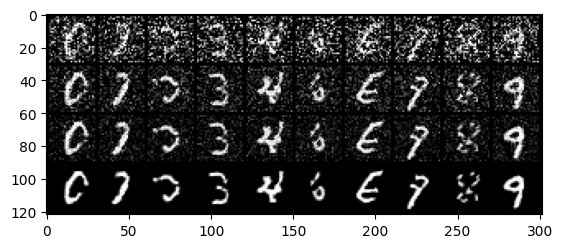

Loss: 0.05250415951013565
Loss: 0.04629085585474968
Loss: 0.05314614623785019
Loss: 0.05402484908699989
Loss: 0.05624815821647644


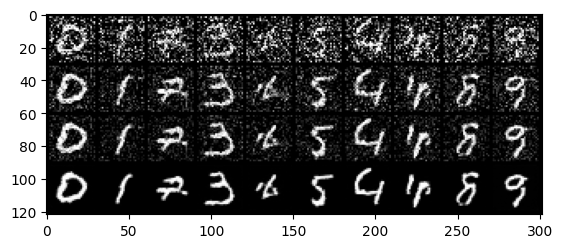

Loss: 0.05126435309648514
Loss: 0.049988508224487305
Loss: 0.05036415904760361
Loss: 0.05741119384765625
Loss: 0.04695191606879234


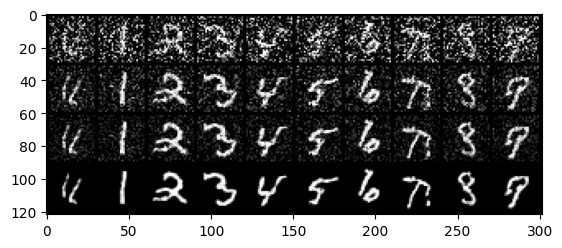

Loss: 0.0510341078042984
Loss: 0.04509364068508148
Loss: 0.05212903395295143
Loss: 0.047380805015563965
Loss: 0.05160803720355034


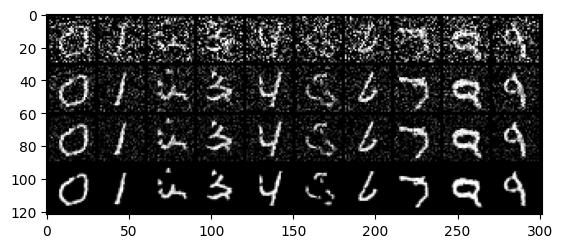

Loss: 0.04643838107585907
Loss: 0.042792994529008865
Loss: 0.04417744278907776
Loss: 0.05357043072581291
Loss: 0.05009104683995247


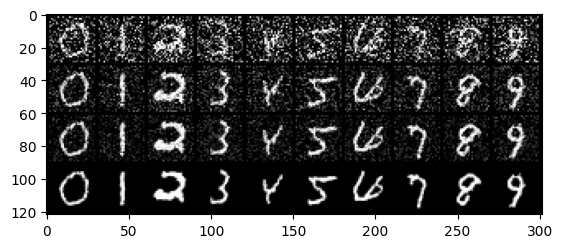

Loss: 0.05189904943108559
Loss: 0.05450332909822464
Loss: 0.0491010807454586
Loss: 0.04248757287859917
Loss: 0.05124760419130325


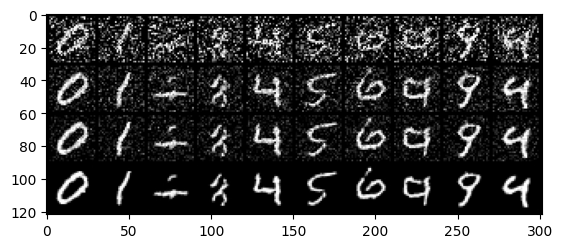

Loss: 0.04497002437710762
Loss: 0.05066152289509773
Loss: 0.04694443568587303
Loss: 0.04498264193534851
Loss: 0.04761552810668945


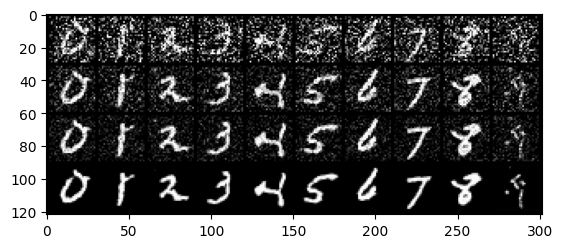

Loss: 0.0502837710082531
Loss: 0.04525249823927879
Loss: 0.04536357522010803
Loss: 0.041240155696868896
Loss: 0.05010666698217392


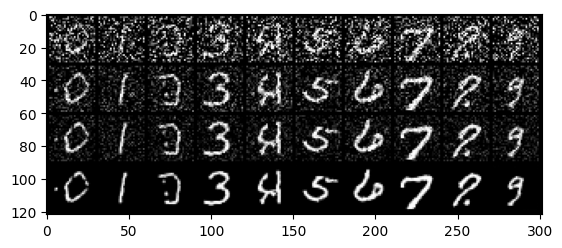

Loss: 0.0520675890147686
Loss: 0.04534044489264488
Loss: 0.04746457561850548
Loss: 0.04307388514280319
Loss: 0.055773958563804626


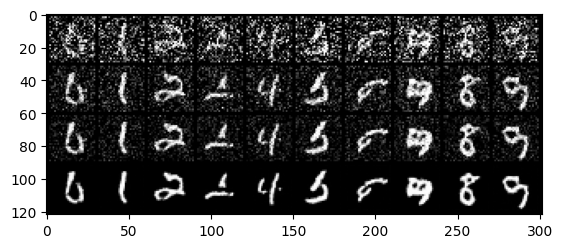

Loss: 0.05558622628450394
Loss: 0.04794596508145332
Loss: 0.04774385318160057
Loss: 0.0446663573384285
Loss: 0.047130439430475235


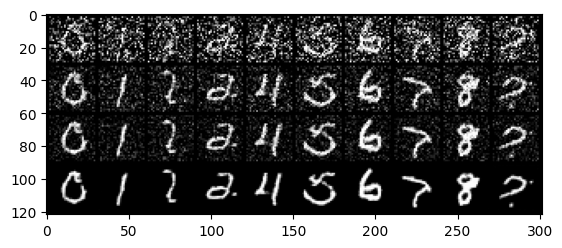

Loss: 0.04273366183042526
Loss: 0.04478376731276512
Loss: 0.051257647573947906
Loss: 0.041117146611213684
Loss: 0.04967166483402252


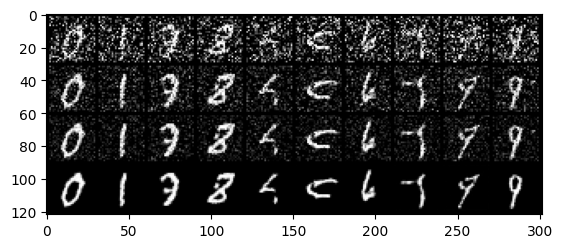

Loss: 0.04660218954086304
Loss: 0.04753527417778969
Loss: 0.05376693978905678
Loss: 0.04262710362672806
Loss: 0.04831823334097862


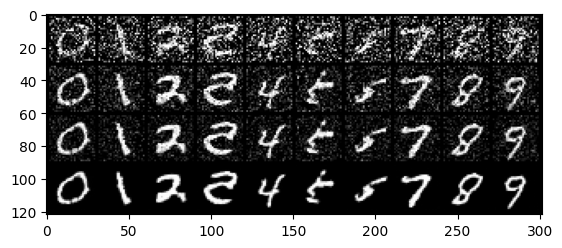

Loss: 0.049759913235902786
Loss: 0.04836181923747063
Loss: 0.04774925485253334
Loss: 0.05146855488419533
Loss: 0.044908542186021805


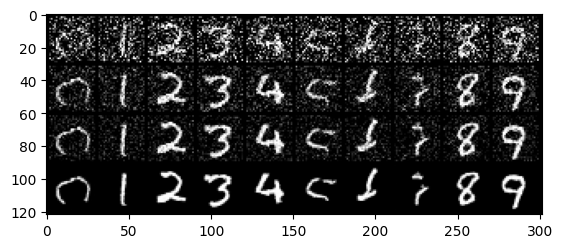

Loss: 0.04905181750655174
Loss: 0.05145164951682091
Loss: 0.047940388321876526
Loss: 0.04646572843194008
Loss: 0.04835709556937218


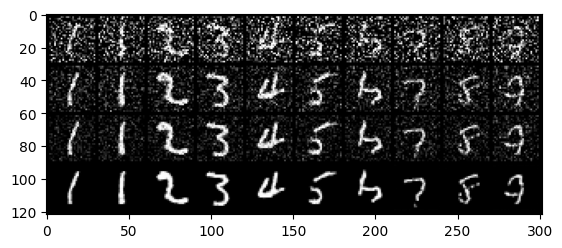

Loss: 0.05422530695796013
Loss: 0.04449949413537979
Loss: 0.04931553080677986
Loss: 0.046711888164281845
Loss: 0.04541962221264839


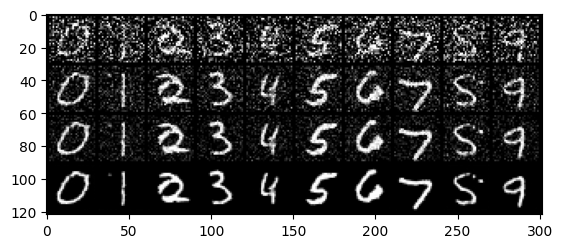

Loss: 0.04252200946211815
Loss: 0.047138214111328125
Loss: 0.05555372312664986
Loss: 0.043041784316301346
Loss: 0.04711318761110306


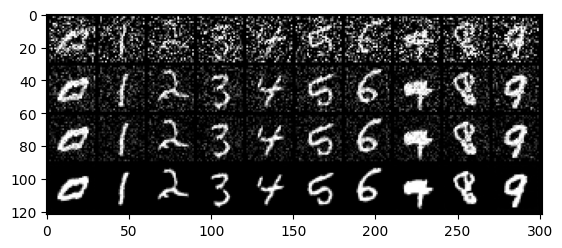

Loss: 0.0463862419128418
Loss: 0.05066296458244324
Loss: 0.05108780786395073
Loss: 0.047203149646520615
Loss: 0.04447771608829498


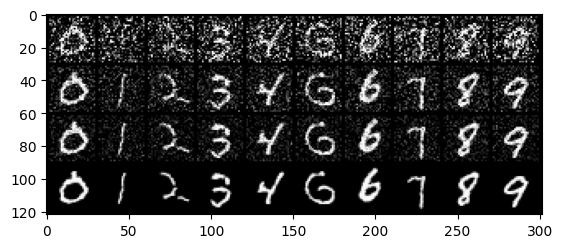

Loss: 0.046592097729444504
Loss: 0.05162409320473671
Loss: 0.04806024953722954
Loss: 0.045956507325172424
Loss: 0.04207024350762367


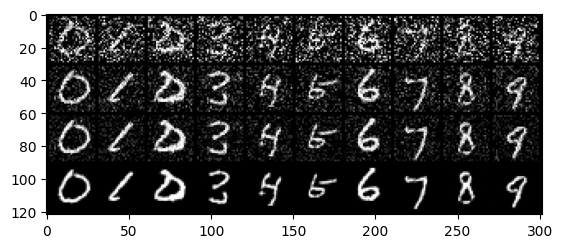

Loss: 0.04659009352326393
Loss: 0.038903623819351196
Loss: 0.042192623019218445
Loss: 0.04089999943971634
Loss: 0.03983493894338608


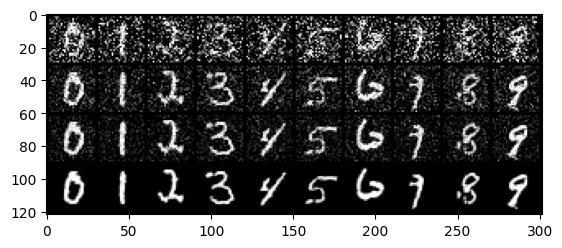

Loss: 0.05123221129179001
Loss: 0.044802118092775345
Loss: 0.04701888561248779
Loss: 0.05089978128671646
Loss: 0.044056929647922516


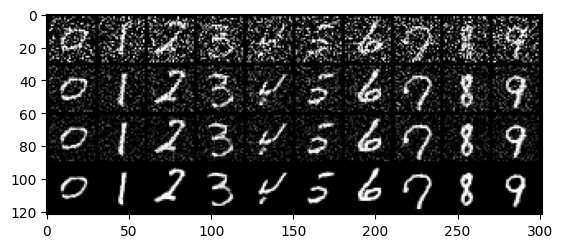

Loss: 0.04792993888258934
Loss: 0.05467844754457474
Loss: 0.04317154735326767
Loss: 0.043478623032569885
Loss: 0.04453376308083534


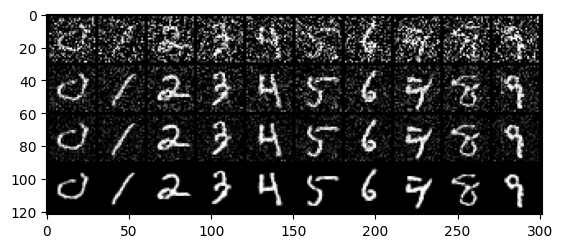

Loss: 0.05185515806078911
Loss: 0.04940842092037201
Loss: 0.046924784779548645
Loss: 0.04152597486972809
Loss: 0.05239425227046013


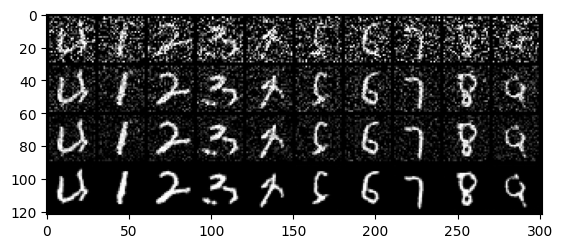

Loss: 0.04519921913743019
Loss: 0.04755577817559242
Loss: 0.04218297824263573
Loss: 0.04763304814696312
Loss: 0.04507109522819519


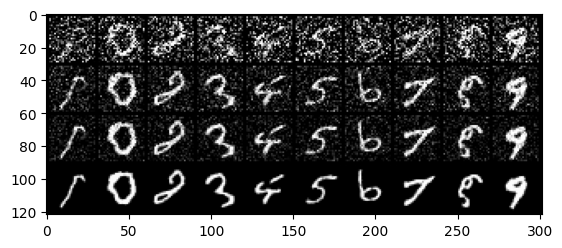

Loss: 0.044525738805532455
Loss: 0.04055164009332657
Loss: 0.041567325592041016
Loss: 0.04467872530221939
Loss: 0.04905543848872185


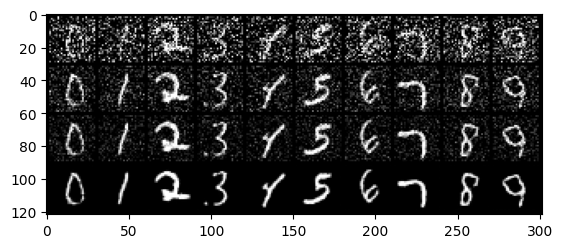

Loss: 0.05340065062046051
Loss: 0.04179435595870018
Loss: 0.04801184684038162
Loss: 0.04137842729687691
Loss: 0.04901444911956787


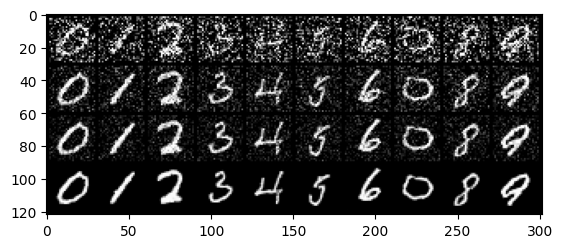

Loss: 0.037497628480196
Loss: 0.04441944509744644
Loss: 0.04663518816232681
Loss: 0.044199466705322266
Loss: 0.04657083377242088


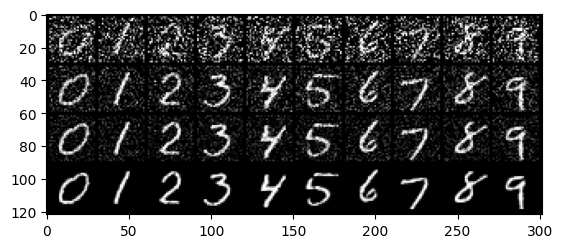

Loss: 0.04177733138203621
Loss: 0.046632956713438034
Loss: 0.03843683376908302
Loss: 0.041216567158699036
Loss: 0.04504169523715973


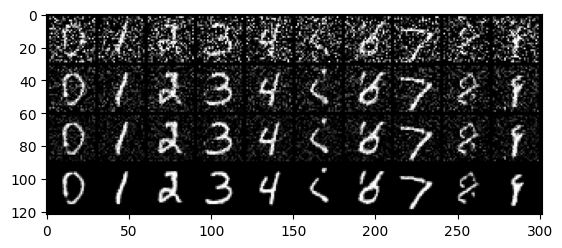

Loss: 0.04234600067138672
Loss: 0.04437901824712753
Loss: 0.046036940068006516
Loss: 0.04497547820210457
Loss: 0.04444257169961929


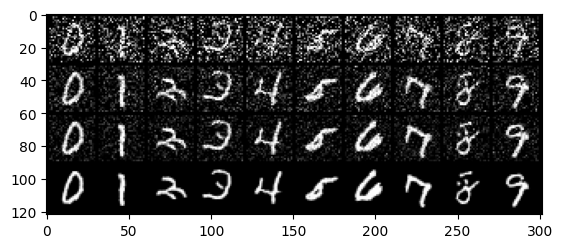

Loss: 0.04697504639625549
Loss: 0.04281281307339668
Loss: 0.04650704935193062
Loss: 0.04883335903286934
Loss: 0.0467633493244648


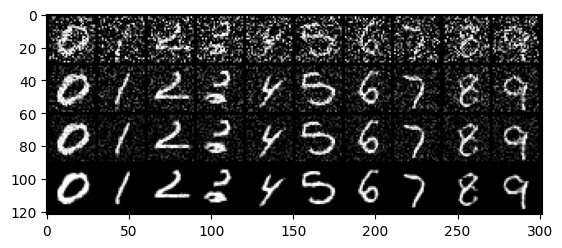

Loss: 0.044409770518541336
Loss: 0.040724094957113266
Loss: 0.046445250511169434
Loss: 0.0437018908560276
Loss: 0.04598788917064667


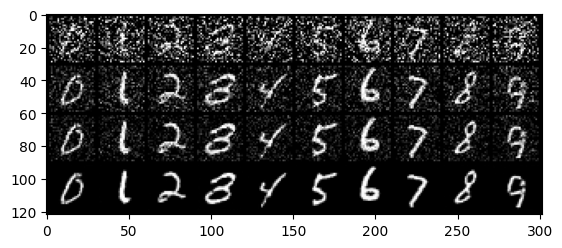

Loss: 0.04940846562385559
Loss: 0.04816349223256111
Loss: 0.04743443429470062
Loss: 0.04687576740980148


In [29]:
class_emb_dim = 10
w = 0.5
model = Model(train_data.image_shape[0], train_data.channels, time_emb_dim = 16, cls_emb_dim=class_emb_dim)
model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
dataloader = DataLoader(train_data, batch_size=128, shuffle=True, pin_memory=True)

mse = nn.MSELoss()
mae = nn.L1Loss()
epochs = 50

for epoch in range(epochs):
    for step, (batch, labels) in enumerate(dataloader):
        optimizer.zero_grad()

        batch_size = batch.shape[0]
        batch = batch.to(device)
        noise = torch.normal(mean=0, std=1, size=batch.shape).to(device)
        #noise = torch.randn_like(batch)
        # À compléter...
        if class_emb_dim is None:
            cls = None
        else:
            cls = labels
        t = torch.randint(low=0, high=schedule.timesteps, size=(batch_size,)).to(device)
        sample_imgs = q_sample(schedule, batch, t, noise=noise)
        predicted_noise = model(sample_imgs, t, cls)
        
        loss = mse(predicted_noise, noise)

        if step % 100 == 0:
            print("Loss:", loss.item())

        if step % 1000 == 0:
            if class_emb_dim:
                lab = torch.arange(0, 10).long()
            else:
                lab = None
            image = sample(schedule, model, 10, lab, w)
            show_images(
                torch.cat(
                    [
                        image[-timesteps // 2],
                        image[-timesteps // 3],
                        image[-timesteps // 4],
                        image[-1],
                    ]
                ),
                nrow = 10
            )

        loss.backward()
        optimizer.step()




In [17]:
# torch.save(the_model.state_dict(), PATH)
# the_model = TheModelClass(*args, **kwargs)
# the_model.load_state_dict(torch.load(PATH))
# save model
# torch.save(model, 'denoise_model.plt')
# load model
model = torch.load('denoise_model.plt')

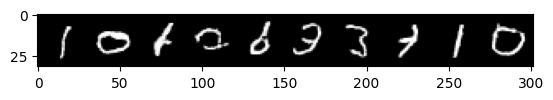

In [18]:
# no guidance
samples = sample(schedule, model, 10, None, w=0.0)
show_images(samples[-1], nrow = 10)

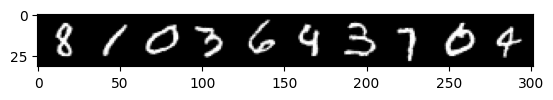

In [19]:
# guidance random
samples = sample(schedule, model, 10, None, w=0.5)
show_images(samples[-1], nrow = 10)

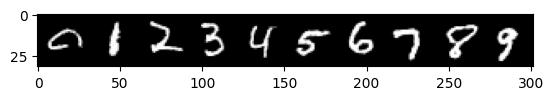

In [23]:
# guidance with labels
lab = torch.arange(0, 10).long()
samples = sample(schedule, model, 10, lab, w=0.5)
show_images(samples[-1], nrow = 10)

# Result as GIF

![result gif url](https://pouch.jumpshare.com/preview/2jvbxEu7V1ugz6SPlpIzFx0okcJm06PPV7kF6rMTSvnCrw1FHwllQb9cisbgxfrbt3y5Ow0dysjYdtc9UrYXRdjyCGvr9lY4OiIDzCtB0bQ)

# Denoising Diffusion Implicit Model

We implement the denoising diffusion implicit Model proposed by Jiaming Song, Chenlin Meng & Stefano Ermon [2], the objective is to reduce sampling time. As cited from the paper: We use the model trained with DDPM (<b>no changes are needed with regards to the training procedure</b>). The only changes that we make is <b>how we produce samples from the model</b>.
$$x_{t-1} = {\sqrt{\alpha_{t-1}}} \left( \frac{x_t - \sqrt{1-\alpha_t}\mathbf{\epsilon}_\theta(\mathbf{x}_t, t)}{\sqrt{\alpha_t}}  \right) + \sqrt{1 - \alpha_{t-1} - \sigma_t^2}.\mathbf{\epsilon}_\theta(\mathbf{x}_t, t) + \sigma_t\epsilon_t$$

Where:
1. $\alpha_t$ in DDIM is $\bar\alpha_{t}$ in DDPM.
2. $\epsilon_t \sim \mathcal N(\mathbf 0, \mathbf I)$
3. $x_0 = \frac{x_t - \sqrt{1-\alpha_t}\mathbf{\epsilon}_\theta(\mathbf{x}_t, t)}{\sqrt{\alpha_t}}$, predicted $x_0$.
4. $\sqrt{1 - \alpha_{t-1} - \sigma_t^2}.\mathbf{\epsilon}_\theta(\mathbf{x}_t, t)$: direction poiting to $x_t$.
5. $\sigma_t = \sqrt{(1-\alpha_{t-1}/(1-\alpha_t)}\sqrt{1-\alpha_t/\alpha_{t-1}}$ for all $t$, the forward process becomes MArkovian, and the generative process becomes a DDPM.
6. When $\sigma_t = 0$ for all $t$, the forward process becomes deterministic given $x_{t-1} and x_0$, except for $t=1$; in the generative process, the coefficient before the random noise $\epsilon_t$ becomes zero. The resulting model becomes an implicit probabilistic model (DDIM).

[2] Jiaming Song, Chenlin Meng & Stefano Ermon, “Denoising Diffusion Implicit Models,” presented at
the ICLR 2021. https://arxiv.org/abs/2010.02502

![image ddim](https://pouch.jumpshare.com/preview/b79vRZfmAgvnA8NpbHOwy5yN4fEA2LkCUGtzJSF820IkGggctYbzLEJc39gYvvdVZvyIc063iWXKFQTP_upDcI5Gb29J4AgUKZZklI6viUU)

In [ ]:
# load model
model = torch.load('denoise_model.plt')

In [81]:
@torch.no_grad()
def p_sample_ddim(schedule: Schedule, model: Model, x: torch.Tensor, t_index: int, labels, w=0.0):
    # 1 is 0 ....
    if t_index > 0:
        # torch.rand is uniform, we want N(0, I)
        z = torch.normal(mean=0, std=1, size=x.shape).cpu()
    else:
        z = 0
    model.eval()
    # if w == 0.0, labels would be None -> second term cancels out -> no guidance
    # do if else to reduce regenating time
    eps_cls = model(x.to(device), (torch.ones(x.shape[0]) * t_index).long(), labels).cpu()
    if w > 0.0:
        eps_no_cls = model(x.to(device), (torch.ones(x.shape[0]) * t_index).long(), None).cpu()
    else:
        eps_no_cls = 0.0
    # no guidance, w=0, eps_cls == eps_no_cls since labels is None
    # guidance -> formule since labels is NOT None
    eps_t = (1+w)*eps_cls - w*eps_no_cls
    model.train()
    # DDPM alpha = DDPM alpha cum prod
    # predict x_0
    Alpha_t = schedule.alphas_cumprod[t_index]
    Alpha_t_1 = schedule.alphas_cumprod[t_index-1]
    x_0 = (x.cpu() - torch.sqrt(1 - Alpha_t)*eps_t)/torch.sqrt(Alpha_t)
    
    sigma_t = 0.0
    dir_x_t = torch.sqrt(1-Alpha_t_1-sigma_t**2)*eps_t
    rand_noise = sigma_t*z # = 0 because sigma_t = 0
    x_t_1 = torch.sqrt(Alpha_t_1)*x_0 + dir_x_t + rand_noise
    return x_t_1.to(device)
    
@torch.no_grad()
def sample_ddim(schedule, model, batch_size=16, labels=None, w=0.0):
    """Sample images from the generation model

    Args:
        schedule (Schedule): The variance schedule
        model (Model): The noise model
        batch_size (int, optional): Number of images to generate. Defaults to 16.

    Returns:
        List[torch.Tensor]: List of images for each time step $x_{T-1}, \ldots, x_0$
    """
    image_size = model.image_size
    channels = model.channels
    device = next(model.parameters()).device
    
    # if there are labels -> batch size of vectors labels will be batch size of img generated
    batch_size = labels.shape[0] if labels is not None else batch_size
    # w == 0.0 -> no guidance
    if w == 0.0:
        labels = None
    elif labels is not None:
        labels = labels.to(device)
    else:
        labels = torch.randint(0, 9, (batch_size,)).to(device)
    
    # Will contain $x_{T-1}, \ldots, x_0$
    imgs = []
    # torch.rand is uniform, we want N(0, I)
    initSize = (batch_size,channels,image_size, image_size)
    x = torch.normal(mean=0, std=1, size=initSize).to(device)
    for t in range(timesteps-1, 0, -1):
        x = p_sample_ddim(schedule, model, x, t, labels, w)
        imgs.append(x)
    return imgs

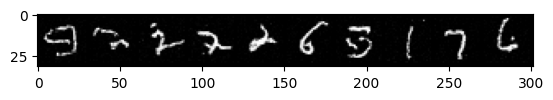

In [82]:
samples = sample_ddim(schedule, model, 10, None, w=0.0)
show_images(samples[-1], nrow = 10)

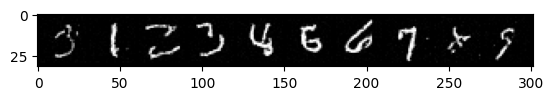

In [83]:
# guidance with labels
lab = torch.arange(0, 10).long()
samples = sample_ddim(schedule, model, 10, lab, w=0.5)
show_images(samples[-1], nrow = 10)